In [1]:
import pandas as pd
import numpy as np
import math

from collections import defaultdict
from collections import Counter
import matplotlib.pylab as plt
from matplotlib.pylab import figure
import seaborn as sns
import folium 
from folium import plugins

In [2]:
df = pd.read_csv("C:/Users/Srihari Ananthan/Downloads/normalizedfeatures.csv")
df_tv = pd.read_excel("C:/Users/Srihari Ananthan/Downloads/compiled_final.xlsx")
df_geo = pd.read_csv("RESEARCH_EXTRACT_GEO_CLEANED.csv")

In [3]:
# fuctions that take input as ip address and return country, city name and more
import geoip2.database

def find_country(idd):
    reader = geoip2.database.Reader('GeoLite2-Country_20200721/GeoLite2-Country.mmdb')
    response = reader.country(idd)
    return response.country.name

def find_city(idd):
    reader1 = geoip2.database.Reader('GeoLite2-City_20200721/GeoLite2-City.mmdb')
    response = reader1.city(idd)
    return response.city.name

print(find_country('105.12.7.2'))
print(find_city('105.12.7.2'))

South Africa
Johannesburg


In [50]:

# checking for matches in geo_ip_0,1,2

count = 0
d = 0
df_geo['New_IP'] = ""
for i in range(41314):
    if df_geo['GEO_IP_2'].values[i] != 'None' and df_geo['GEO_IP_1'].values[i] != 'None':
        count+=1
        if df_geo['GEO_IP_2'].values[i] == df_geo['GEO_IP_1'].values[i] and df_geo['GEO_IP_1'].values[i] == df_geo['GEO_IP_0'].values[i]:
            d+=1
            df_geo['New_IP'].values[i] = df_geo['GEO_IP_2'].values[i]
        elif df_geo['GEO_IP_0'].values[i] == df_geo['GEO_IP_1'].values[i] or df_geo['GEO_IP_0'].values[i] == df_geo['GEO_IP_2'].values[i]:
            df_geo['New_IP'].values[i] = df_geo['GEO_IP_0'].values[i]
        elif df_geo['GEO_IP_2'].values[i] == df_geo['GEO_IP_1'].values[i]:
            df_geo['New_IP'].values[i] = df_geo['GEO_IP_2'].values[i]
 
# no match ip in geo_ip1 , 2 , or 3

count = 0
d = 0
p = 0
for i in range(41314):
        if df_geo['GEO_IP_1'].values[i] != 'None' and df_geo['GEO_IP_0'].values[i] != 'None':
            count+=1
            if df_geo['GEO_IP_1'].values[i] == df_geo['GEO_IP_0'].values[i]:
                d+=1
            else:
                p+=1

print(count , d, p)


count = 0
d = 0
for i in range(41314):
        if df_geo['GEO_IP_0'].values[i] != 'None' :
            count+=1
            if df_geo['GEO_IP_1'].values[i] != 'None' and df_geo['GEO_IP_2'].values[i] != 'None' :
                if df_geo['GEO_IP_2'].values[i] == df_geo['GEO_IP_1'].values[i]:
                    df_geo['GEO_IP_0'].values[i] = df_geo['GEO_IP_2'].values[i]

            if df_geo['GEO_IP_2'].values[i]!= 'None' and df_geo['GEO_IP_0'].values[i] == df_geo['GEO_IP_2'].values[i]:
                    d+=1
                    df_geo['GEO_IP_0'].values[i] = df_geo['GEO_IP_2'].values[i]
            
            if df_geo['GEO_IP_1'].values[i]!= 'None' and df_geo['GEO_IP_0'].values[i] == df_geo['GEO_IP_1'].values[i]:
                    d+=1
                    df_geo['GEO_IP_0'].values[i] = df_geo['GEO_IP_1'].values[i]
                    
c =0
d=0
p=0
for i in range(41314):
    if len(df_geo['GEO_IP_0'].values[i]) > 15:
        c+=1
        if df_geo['GEO_IP_1'].values[i] != 'None' and len(df_geo['GEO_IP_1'].values[i]) <= 15:
            d+=1
            try:
                if find_city(df_geo['GEO_IP_0'].values[i]) == find_city(df_geo['GEO_IP_1'].values[i]):
                    p+=1
                    df_geo['GEO_IP_0'].values[i] = df_geo['GEO_IP_1'].values[i]
            except:
                df_geo['GEO_IP_0'].values[i] = 'None'
                
print(c,d,p)


KeyError: 'GEO_IP_2'

In [ ]:
# NO VALUES IN ANY OF THE GEO_IP_0, GEO_IP_1, GEO_IP_2 MATCH

# AND WHEN GEO_IP_0 HAS EMPTY VALUES SO DOES THE OTHER TWO

# ABOVE CODE HAS CONVERTED POSSIBLE IPV6 ADD TO IPV4 ADD

In [ ]:
# drop these below column after confirming on possible interchange in values

df_geo = df_geo.drop(['GEO_IP_1', 'GEO_IP_2','GEO_CITY_1', 'GEO_CITY_2','GEO_LAT_1', 'GEO_LAT_2','GEO_LNG_1', 'GEO_LNG_2','GEO_REGION_1','GEO_REGION_2'],axis =1)


In [4]:
# reading the data which had the label produced by lof/hbos

df_final = pd.read_csv('C:/Users/Srihari Ananthan/Downloads/finallabeleddata_new.csv')

In [8]:
#using folium to create a map with cases shown

def plot_on_map():
    map = folium.Map(location=[20, 70], zoom_start=6,tiles='Stamenterrain')
    value =0.1 


    try:
        for lat, lon, name,flag in zip(df_final['GEO_LAT_0'], df_final['GEO_LNG_0'], df_final['GEO_COUNTRY_0'],df_final['TV_hbos']):
            if flag == 'n':
                folium.CircleMarker([lat, lon], radius=value*0.0005, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='red').add_to(map)
            else:
                folium.CircleMarker([lat, lon], radius=value*0.0005, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='blue',fill_color='blue',fill_opacity=0.1 ).add_to(map)

    except:
        pass

    from branca.element import Template, MacroElement

    template = """
    {% macro html(this, kwargs) %}

    <!doctype html>
    <html lang="en">
    <head>
      <meta charset="utf-8">
      <meta name="viewport" content="width=device-width, initial-scale=1">
      <title>jQuery UI Draggable - Default functionality</title>
      <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

      <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
      <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>

      <script>
      $( function() {
        $( "#maplegend" ).draggable({
                        start: function (event, ui) {
                            $(this).css({
                                right: "auto",
                                top: "auto",
                                bottom: "auto"
                            });
                        }
                    });
    });

      </script>
    </head>
    <body>


    <div id='maplegend' class='maplegend' 
        style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
         border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>

    <div class='legend-title'>Legend</div>
    <div class='legend-scale'>
      <ul class='legend-labels'>
        <li><span style='background:red;opacity:0.7;'></span>True</li>
        <li><span style='background:blue;opacity:0.7;'></span>False</li>

      </ul>
    </div>
    </div>

    </body>
    </html>

    <style type='text/css'>
      .maplegend .legend-title {
        text-align: left;
        margin-bottom: 5px;
        font-weight: bold;
        font-size: 90%;
        }
      .maplegend .legend-scale ul {
        margin: 0;
        margin-bottom: 5px;
        padding: 0;
        float: left;
        list-style: none;
        }
      .maplegend .legend-scale ul li {
        font-size: 80%;
        list-style: none;
        margin-left: 0;
        line-height: 18px;
        margin-bottom: 2px;
        }
      .maplegend ul.legend-labels li span {
        display: block;
        float: left;
        height: 16px;
        width: 30px;
        margin-right: 5px;
        margin-left: 0;
        border: 1px solid #999;
        }
      .maplegend .legend-source {
        font-size: 80%;
        color: #777;
        clear: both;
        }
      .maplegend a {
        color: #777;
        }
    </style>
    {% endmacro %}"""

    macro = MacroElement()
    macro._template = Template(template)

    map.get_root().add_child(macro)

    return map
    
    map.save('plot_data_hbos.html')

In [9]:
map = plot_on_map()
map

In [10]:
# create 3d sphere and wrape image of world map arounf it to create globe

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def mpl_sphere(image_file):
    img = plt.imread(image_file)

    # define a grid matching the map size, subsample along with pixels
    theta = np.linspace(0, np.pi, img.shape[0])
    phi = np.linspace(0, 2*np.pi, img.shape[1])

    count = 180 # keep 180 points along theta and phi
    theta_inds = np.linspace(0, img.shape[0] - 1, count).round().astype(int)
    phi_inds = np.linspace(0, img.shape[1] - 1, count).round().astype(int)
    theta = theta[theta_inds]
    phi = phi[phi_inds]
    img = img[np.ix_(theta_inds, phi_inds)]

    theta,phi = np.meshgrid(theta, phi)
    R = 1

    # sphere
    x = R * np.sin(theta) * np.cos(phi)
    y = R * np.sin(theta) * np.sin(phi)
    z = R * np.cos(theta)

    # create 3d Axes
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x.T, y.T, z.T, facecolors=img/255, cstride=1, rstride=1) # we've already pruned ourselves

    # make the plot more spherical
    ax.axis('scaled')


NotImplementedError: It is not currently possible to manually set the aspect on 3D axes

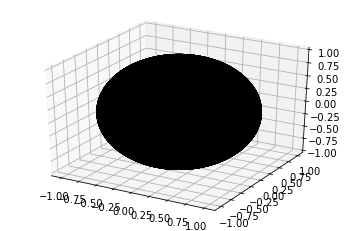

In [11]:
image_file = "C:/Users/Srihari Ananthan/Desktop/SnowIceCover_Daily.png"
mpl_sphere(image_file)

In [12]:
# create dictonary to count freq of models, and move modes whoes freq < 50 in to 'Others'
# same fuction can be used to plot other data too, replace 'Model' and 'GEO_COUNTRY_0' with other columns you want

def plot_on_scatter():
    d = {} # can also use defaultdict (from collections import defaultdict) to make dictonary freq counting easier

    for i in df_tv['Model']:
        if i in d:
            d[i] += 1
        else:
            d[i] = 1

    print(d)

    for i in range(41153):
        if d[df_tv['Model'].values[i]] < 50:
            df_tv['Model'].values[i] = 'Others'

    # plotting on scatter plot based on outliers (o) or inliers(n)

    arr_m_n = []
    arr_m_o = []
    arr_f_n = []
    arr_f_o = []
    for i in range(41153):
        if df_final['TV_hbos'].values[i] == 'n':
            arr_m_n.append(str(df_tv['Model'].values[i]))
            arr_f_n.append(str(df_tv['GEO_COUNTRY_0'].values[i]))
        else:
            arr_m_o.append(str(df_tv['Model'].values[i]))
            arr_f_o.append(str(df_tv['GEO_COUNTRY_0'].values[i]))

    import matplotlib.pyplot as plt
    import pandas as pd

    plt.figure(figsize=(130,70))
    plt.xticks(
        rotation=45, 
        horizontalalignment='right',
        fontweight='light',
        fontsize='50'  
    )

    plt.yticks(

        horizontalalignment='right',
        fontweight='light',
        fontsize='50'  
    )

    plt.scatter(arr_m_n,arr_f_n, color='b',linewidths=50)
    plt.scatter(arr_m_o,arr_f_o, color='r',linewidths=25)


    plt.xlabel('Modelr')
    plt.ylabel('GEO_COUNTRY_0')
    plt.show()

{'SM-J701M': 110, 'LG-M250': 312, 'HUAWEI': 236, 'Moto': 3257, 'SM-G930U': 5, 'SM-G900H': 10, 'TA-1032': 10, 'moto': 2783, 'MotoG3': 170, 'SM-J610G': 471, 'SNE-LX3': 267, 'SM-A750G': 231, 'SM-G532M': 253, 'SM-J710MN': 275, 'PRA-LX3': 60, 'A1601': 82, 'SM-J500M': 428, 'ANE-LX3': 492, 'DUB-LX3': 83, 'SM-G610M': 967, 'SM-J810M': 582, 'SM-G570M': 743, 'RNE-L22': 89, 'SM-J111M': 34, 'SM-G531H': 108, 'TRT-LX3': 34, 'SM-A520F': 197, 'POT-LX3': 211, 'SM-G950U': 101, 'SM-J250M': 63, 'MAR-LX3A': 120, 'OWN': 3, 'F6002': 1, 'TA-1028': 16, 'ANE-LX2': 28, 'ALE-L21': 27, 'LG-M700': 105, 'SM-G975F': 276, 'SM-J730GM': 98, 'SM-G950F': 554, 'SM-J327V': 1, 'Redmi': 1866, 'MotoE2(4G-LTE)': 24, 'vivo': 745, 'Lenovo': 320, 'ZE553KL': 31, 'SM-G960F': 138, 'LGMS345': 1, 'CPH1803': 97, 'LG-SP320': 3, 'LLD-AL20': 21, 'SM-G955F': 417, 'Z981': 11, 'ASUS_Z00LD': 22, 'Z557BL': 3, 'Flare': 1, 'LT50+': 1, 'Mi': 404, 'SM-G965U': 83, 'ALP-L09': 7, 'SM-G935T': 21, 'HTC_M10h': 11, 'ANE-LX1': 51, 'SM-J120M': 17, 'SM-G960U'

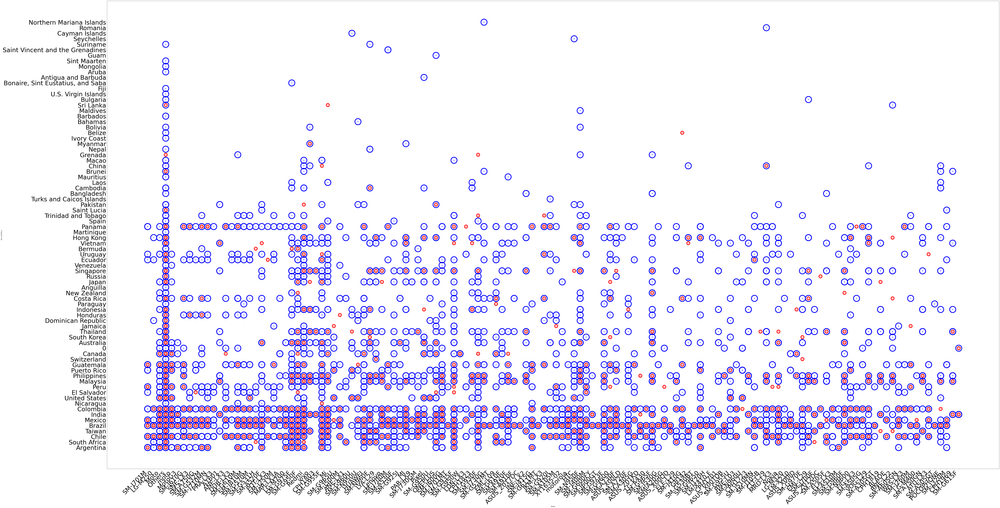

In [13]:
plot_on_scatter()

In [41]:
# function find origin and providers of bad bots considered over certain thersholds
def find_bad_bots():
    arr_m_n = []
    arr_m_o = []
    arr_f_n = []
    arr_f_o = []
    arrn = []
    arro = []
    for i in range(41153):
        if df_final['TV_hbos'].values[i] == 'n':
            arr_m_n = []
            arr_m_n.append(str(df_tv['unload_ms'].values[i] - df_tv['time'].values[i]))
            arr_m_n.append(str(df_tv['GEO_COUNTRY_0'].values[i]))
            arr_m_n.append(str(df_tv['GEO_AS_0'].values[i]))
            arr_m_n.append(str(df_tv['Model'].values[i]))

            arrn.append(arr_m_n)
        else:
            arr_m_o= []
            arr_m_o.append(str(df_tv['unload_ms'].values[i] - df_tv['time'].values[i]))
            arr_m_o.append(str(df_tv['GEO_COUNTRY_0'].values[i]))
            arr_m_o.append(str(df_tv['GEO_AS_0'].values[i]))
            arr_m_o.append(str(df_tv['Model'].values[i]))

            arro.append(arr_m_o)
    
    count = 0
    d = {}
    d1 = {}
    d2 = {}
    for i in range(len(arro)):
        if int(arro[i][0]) >= 120000:

            if arro[i][1] in d:
                d[arro[i][1]] += 1
            else:
                d[arro[i][1]] = 1

            if arro[i][2] in d:
                d1[arro[i][2]] += 1
            else:
                d1[arro[i][2]] = 1

            if arro[i][3] in d:
                d2[arro[i][3]] += 1
            else:
                d2[arro[i][3]] = 1
        
    return d, d1, d2

In [49]:
countries, providers, device_models = find_bad_bots()
print("Countries that have bad bots are: \n", countries)
print(" \n\n Providers that have bad bots are: \n",providers)
print(" \n\n Devices/companies/models that have bad bots are: \n",device_models)

Countries that have bad bots are: 
 {'Taiwan': 6, 'Philippines': 1, 'Australia': 2, 'Colombia': 4, 'South Africa': 1, 'Chile': 3, 'Canada': 3, 'Hong Kong': 1, 'Malaysia': 1, 'India': 7, 'Brazil': 18, 'Mexico': 3, 'Grenada': 1, 'Panama': 1, 'Japan': 1, 'Singapore': 1, 'United States': 1, 'Sri Lanka': 1}
 

 Providers that have bad bots are: 
 {'Taiwan Mobile': 1, 'Mobile Business': 1, 'Philippine Long': 1, 'Telstra Corporation': 1, 'COMCEL S.A.': 1, 'SAIX-NET': 1, 'TELEFÃƒâ€œNICA CHILE': 1, 'Novus Entertainment': 1, 'HKT Limited': 1, 'DiGi Telecommunications': 1, 'Reliance Jio': 1, 'R L': 1, 'TELEFÃƒâ€\x9dNICA BRASIL': 1, 'CLARO S.A.': 1, 'Tim Celular': 1, 'Centennial Cayman': 1, 'Data Communication': 1, 'Colombia MÃƒÂ³vil': 1, 'TPG Telecom': 1, 'Vodafone India': 1, 'CLARO CHILE': 1, 'CICERO MOREIRA': 1, 'TOTAL PLAY': 1, 'Uninet S.A.': 1, 'Jackeline S': 1, 'Columbus Communications': 1, 'Far EastTone': 1, 'Cable Onda': 1, 'Telmex Colombia': 1, 'Brasil Telecom': 1, 'KDDI CORPORATION': 1, 